## Imports

In [9]:
%load_ext autoreload
%autoreload 2

# Standard imports
import glob

# 3rd party imports
import cv2
import matplotlib.pyplot as plt
import numpy as np 
from pprint import pprint
import SimpleITK as sitk

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Functions

In [10]:
def read_tif(filepath):
    """
    Read tiff files using SimpleITK
    
    Args:
        filepath: str, path to tiff file
        
    Returns:
        image: np.ndarray, tiff image
    """
    image = sitk.ReadImage(filepath)
    image = sitk.GetArrayFromImage(image)
    return image


def auto_contrast(data: np.ndarray, alpha: float = None, beta: float = None) -> np.ndarray:
    """
    Preprocess tiff files to automatically adjust brightness and contrast.
    https://stackoverflow.com/questions/56905592/automatic-contrast-and-brightness-adjustment-of-a-color-photo-of-a-sheet-of-pape
    """
    if not alpha:
        alpha = np.iinfo(data.dtype).max / (np.max(data) - np.min(data))
    if not beta:
        beta = -np.min(data) * alpha
    img = cv2.convertScaleAbs(data.copy(), alpha=alpha, beta=beta)
    return img


def gamma_correction(image: np.ndarray, gamma: float=2.0) -> np.ndarray:
    """
    Apply gamma correction to the image.
    
    Args:
        image: np.ndarray, input image
        gamma: float, gamma value
        
    Returns:
        image_enhanced: np.ndarray, gamma corrected image
    """
    # Normalize the image to the range [0, 1]
    image_normalized = image / image.max()
    # Apply the exponential transformation
    image_enhanced = np.power(image_normalized, gamma)
    # Rescale the image back to the original intensity range
    image_enhanced = image_enhanced * image.max()
    return image_enhanced


def compute_average_image(images):
    """
    Compute the average image from a list of images.
    
    Args:
        images: list, list of images
        
    Returns:
        average_image: np.ndarray, average image
    """
    average_image = np.mean(images, axis=0)
    return average_image


def show_4(original_image, contrast_enhanced, thresholded, xlim=None, ylim=None):
    plt.figure(figsize=(20, 20))
    plt.subplot(2, 2, 1)
    plt.imshow(original_image, cmap='gray')
    plt.title("Original zoomed")
    if xlim is not None:
        plt.xlim(xlim)
        plt.ylim(ylim[::-1])

    plt.subplot(2, 2, 2)
    plt.imshow(contrast_enhanced, cmap='gray')
    plt.title("Contrast enhanced")
    if xlim is not None:
        plt.xlim(xlim)
        plt.ylim(ylim[::-1])

    plt.subplot(2, 2, 3)
    plt.imshow(thresholded, cmap='gray')
    plt.title("Thresholded")
    if xlim is not None:
        plt.xlim(xlim)
        plt.ylim(ylim[::-1])

    plt.subplot(2, 2, 4)
    plt.imshow(contrast_enhanced, cmap='gray')
    plt.contour(thresholded, colors='red', linewidths=0.5, alpha=0.35)
    plt.title("Contrast enhanced + contour")
    if xlim is not None:
        plt.xlim(xlim)
        plt.ylim(ylim[::-1])
    plt.show()
    
    
def save_figure(image, filename, contours=None):
    plt.figure(figsize=(20, 20))
    plt.imshow(image, cmap='gray')
    if contours is not None:
        plt.contour(contours, colors='red', linewidths=0.15, alpha=0.35)
    plt.axis('off')
    plt.savefig(filename, dpi=600, bbox_inches='tight')
    print(f"Saved figure to {filename}")

## Load data

In [11]:
data_folder_path = "data/ch0/"
start_idx = 5
end_idx = start_idx + 10

# Read all tif files in the folder
data_files = sorted(glob.glob(data_folder_path + "*.tif"))
pprint(data_files[start_idx:end_idx])
images = [read_tif(filepath) for filepath in data_files[start_idx:end_idx]]

['data/ch0/T9_52ms_488-150_560-150_640-200_4.33zoom_1.5x_bothlaser_z=3um_2607planes '
 '- Pos 7 7 [1] 3DMontage Complete_XY1726268046_Z1303_T0_C0.tif',
 'data/ch0/T9_52ms_488-150_560-150_640-200_4.33zoom_1.5x_bothlaser_z=3um_2607planes '
 '- Pos 7 7 [1] 3DMontage Complete_XY1726268046_Z1304_T0_C0.tif',
 'data/ch0/T9_52ms_488-150_560-150_640-200_4.33zoom_1.5x_bothlaser_z=3um_2607planes '
 '- Pos 7 7 [1] 3DMontage Complete_XY1726268046_Z1305_T0_C0.tif',
 'data/ch0/T9_52ms_488-150_560-150_640-200_4.33zoom_1.5x_bothlaser_z=3um_2607planes '
 '- Pos 7 7 [1] 3DMontage Complete_XY1726268046_Z1306_T0_C0.tif',
 'data/ch0/T9_52ms_488-150_560-150_640-200_4.33zoom_1.5x_bothlaser_z=3um_2607planes '
 '- Pos 7 7 [1] 3DMontage Complete_XY1726268046_Z1307_T0_C0.tif',
 'data/ch0/T9_52ms_488-150_560-150_640-200_4.33zoom_1.5x_bothlaser_z=3um_2607planes '
 '- Pos 7 7 [1] 3DMontage Complete_XY1726268046_Z1308_T0_C0.tif',
 'data/ch0/T9_52ms_488-150_560-150_640-200_4.33zoom_1.5x_bothlaser_z=3um_2607planes '
 '

TIFFReadDirectory: Warning, Unknown field with tag 65000 (0xfde8) encountered.
TIFFReadDirectory: Warning, Unknown field with tag 65001 (0xfde9) encountered.
TIFFReadDirectory: Warning, Unknown field with tag 65002 (0xfdea) encountered.
TIFFReadDirectory: Warning, Unknown field with tag 65003 (0xfdeb) encountered.
TIFFReadDirectory: Warning, Unknown field with tag 65004 (0xfdec) encountered.
TIFFReadDirectory: Warning, Unknown field with tag 65005 (0xfded) encountered.
TIFFReadDirectory: Warning, Unknown field with tag 65006 (0xfdee) encountered.
TIFFReadDirectory: Warning, Unknown field with tag 65007 (0xfdef) encountered.
TIFFReadDirectory: Warning, Unknown field with tag 65008 (0xfdf0) encountered.
TIFFReadDirectory: Warning, Unknown field with tag 65000 (0xfde8) encountered.
TIFFReadDirectory: Warning, Unknown field with tag 65001 (0xfde9) encountered.
TIFFReadDirectory: Warning, Unknown field with tag 65002 (0xfdea) encountered.
TIFFReadDirectory: Warning, Unknown field with tag 6

## Stats and histogram

Image shape: (14233, 12249)
Image type: uint16
Image min: 0
Image max: 7055
Image mean: 375.42261170021567
Image std: 234.27123795250063
Image mean + 3 std: 1078.2363255577175
Image mean + 2 std: 843.9650876052169
Image mean + 1 std: 609.6938496527163
Image mean - 1 std: 141.15137374771504
Image mean - 2 std: -93.11986420478559
Image mean - 3 std: -327.3911021572862


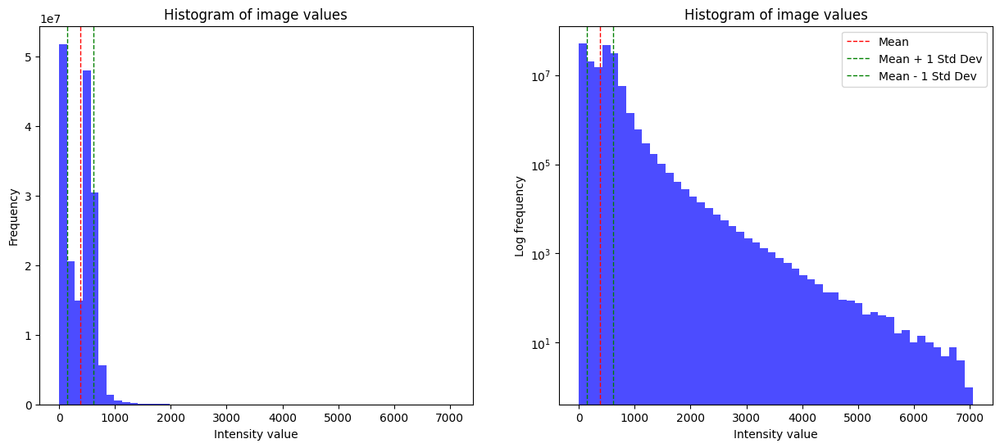

In [12]:
curr_img = images[0]

# Show statistics of the image
image_min = curr_img.min()
image_max = curr_img.max()
image_mean = curr_img.mean()
image_std = curr_img.std()

print("Image shape:", curr_img.shape)
print("Image type:", curr_img.dtype)
print("Image min:", image_min)
print("Image max:", image_max)
print("Image mean:", image_mean)
print("Image std:", image_std)
print("Image mean + 3 std:", image_mean + 3 * image_std)
print("Image mean + 2 std:", image_mean + 2 * image_std)
print("Image mean + 1 std:", image_mean + image_std)
print("Image mean - 1 std:", image_mean - image_std)
print("Image mean - 2 std:", image_mean - 2 * image_std)
print("Image mean - 3 std:", image_mean - 3 * image_std)

# Plot histogram of image values
plt.figure(figsize=(15, 6))
plt.subplot(1, 2, 1)
plt.hist(curr_img.flatten(), bins=50, color='blue', alpha=0.7)
plt.title("Histogram of image values")
plt.xlabel("Intensity value")
plt.ylabel("Frequency")
plt.axvline(image_mean, color='red', linestyle='dashed', linewidth=1, label='Mean')  # Add lines for mean and standard deviation
plt.axvline(image_mean + image_std, color='green', linestyle='dashed', linewidth=1, label='Mean + 1 Std Dev')
plt.axvline(image_mean - image_std, color='green', linestyle='dashed', linewidth=1, label='Mean - 1 Std Dev')
# Second plot with log scale
plt.subplot(1, 2, 2)
plt.hist(curr_img.flatten(), bins=50, color='blue', alpha=0.7)
plt.yscale('log')
plt.title("Histogram of image values")
plt.xlabel("Intensity value")
plt.ylabel("Log frequency")
plt.axvline(image_mean, color='red', linestyle='dashed', linewidth=1, label='Mean')
plt.axvline(image_mean + image_std, color='green', linestyle='dashed', linewidth=1, label='Mean + 1 Std Dev')
plt.axvline(image_mean - image_std, color='green', linestyle='dashed', linewidth=1, label='Mean - 1 Std Dev')

# Add legend
plt.legend()
plt.show()

Try example threshold on raw image

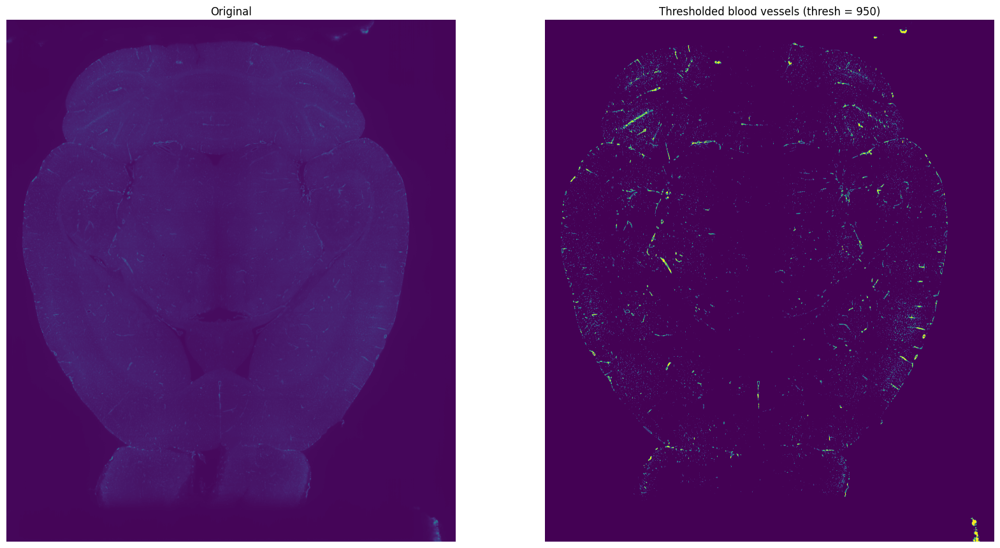

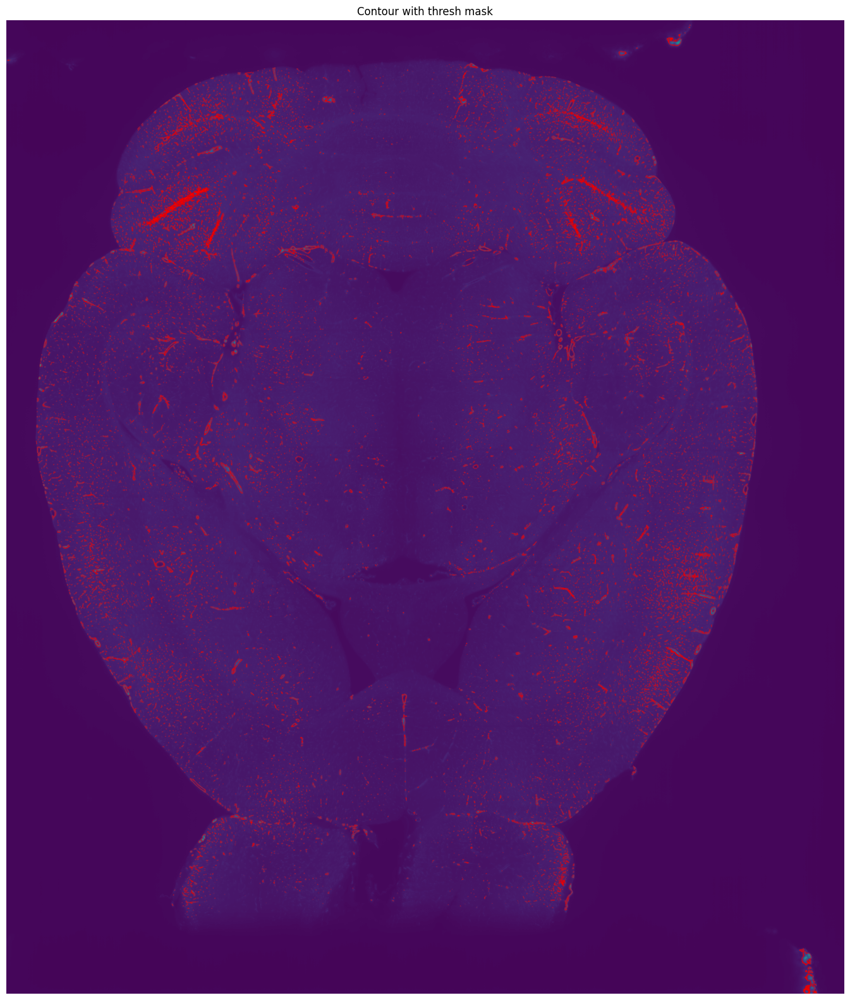

In [13]:
thresh = 950

thresh_mask = curr_img > thresh
thresh_mask = thresh_mask.astype(bool)

plt.figure(figsize=(20, 20))  
plt.subplot(1, 2, 1)  # Original image
plt.imshow(curr_img, cmap='viridis')
plt.title("Original")
plt.axis('off')
plt.subplot(1, 2, 2)  # Thresholded mask
plt.imshow(thresh_mask, cmap='viridis')
plt.title(f"Thresholded blood vessels (thresh = {thresh})")
plt.axis('off')
plt.show()

# Show contour on the image
plt.figure(figsize=(20, 20))
plt.imshow(curr_img, cmap='viridis')
plt.title("Contour with thresh mask")
plt.contour(thresh_mask, colors='red', linewidths=1, alpha=0.3)
plt.axis('off')
plt.show()

Apply exponential scaling on the image

Enhanced scaled image:
Image shape: (14233, 12249)
Image type: float64
Image min: 0.0
Image max: 7055.0
Image mean: 27.75693129803099
Image std: 36.34035771154178
Image mean + 3 std: 136.77800443265633
Image mean + 2 std: 100.43764672111455
Image mean + 1 std: 64.09728900957276
Image mean - 1 std: -8.583426413510786
Image mean - 2 std: -44.92378412505256
Image mean - 3 std: -81.26414183659435


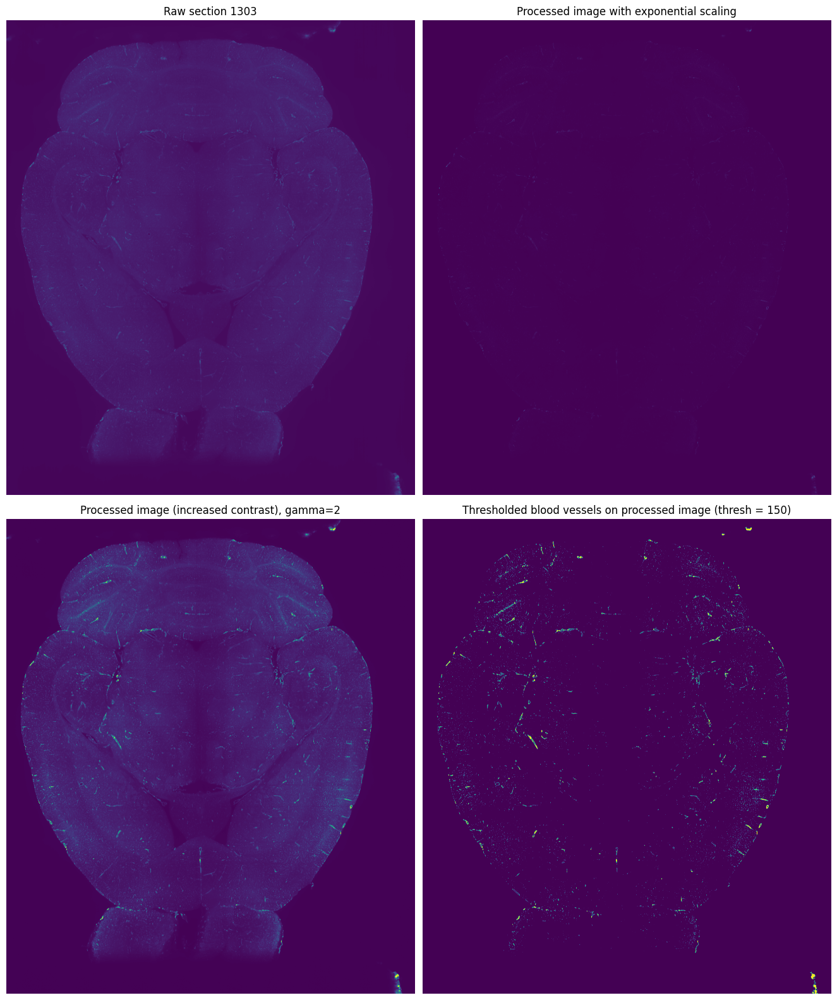

In [14]:
gamma = 2  # You can adjust this value to control the contrast enhancement
contrast_alpha = 0.5  # Try 0.15 You can adjust this value to control the brightness enhancement
thresh = 150


image_enhanced = gamma_correction(curr_img, gamma=gamma)

thresh_mask = image_enhanced > thresh
thresh_mask = thresh_mask.astype(bool)

# Show statistics of the image
enhanced_min = image_enhanced.min()
enhanced_max = image_enhanced.max()
enhanced_mean = image_enhanced.mean()
enhanced_std = image_enhanced.std()

print("Enhanced scaled image:")
print("Image shape:", image_enhanced.shape)
print("Image type:", image_enhanced.dtype)
print("Image min:", enhanced_min)
print("Image max:", enhanced_max)
print("Image mean:", enhanced_mean)
print("Image std:", enhanced_std)
print("Image mean + 3 std:", enhanced_mean + 3 * enhanced_std)
print("Image mean + 2 std:", enhanced_mean + 2 * enhanced_std)
print("Image mean + 1 std:", enhanced_mean + enhanced_std)
print("Image mean - 1 std:", enhanced_mean - enhanced_std)
print("Image mean - 2 std:", enhanced_mean - 2 * enhanced_std)
print("Image mean - 3 std:", enhanced_mean - 3 * enhanced_std)

"""
# Plot histogram of image values
plt.figure(figsize=(15, 6))
plt.subplot(1, 2, 1)
plt.hist(image_enhanced.flatten(), bins=50, color='blue', alpha=0.7)
plt.title("Histogram of enhanced image values")
plt.xlabel("Intensity value")
plt.ylabel("Frequency")
plt.axvline(enhanced_mean, color='red', linestyle='dashed', linewidth=1, label='Mean')  # Add lines for mean and standard deviation
plt.axvline(enhanced_mean + enhanced_std, color='green', linestyle='dashed', linewidth=1, label='Mean + 1 Std Dev')
plt.axvline(enhanced_mean - enhanced_std, color='green', linestyle='dashed', linewidth=1, label='Mean - 1 Std Dev')
# Second plot with log scale
plt.subplot(1, 2, 2)
plt.hist(image_enhanced.flatten(), bins=50, color='blue', alpha=0.7)
plt.yscale('log')
plt.title("Histogram of enhanced image values")
plt.xlabel("Intensity value")
plt.ylabel("Log frequency")
plt.axvline(enhanced_mean, color='red', linestyle='dashed', linewidth=1, label='Mean')
plt.axvline(enhanced_mean + enhanced_std, color='green', linestyle='dashed', linewidth=1, label='Mean + 1 Std Dev')
plt.axvline(enhanced_mean - enhanced_std, color='green', linestyle='dashed', linewidth=1, label='Mean - 1 Std Dev')
# Add legend
plt.legend()
plt.show()
"""

# Plot the original and enhanced images
plt.figure(figsize=(17, 20))
plt.subplot(2, 2, 1)  # Original image
plt.imshow(curr_img, cmap='viridis')
plt.title("Raw section 1303")
plt.axis('off')
plt.subplot(2, 2, 2)  # Enhanced image
plt.imshow(image_enhanced, cmap='viridis')
plt.title("Processed image with exponential scaling")
plt.axis('off')

# Plot enhanced image no modifications
#plt.figure(figsize=(20, 20))
plt.subplot(2, 2, 3)
plt.imshow(auto_contrast(image_enhanced, alpha=contrast_alpha), cmap='viridis')
plt.title(f"Processed image (increased contrast), gamma={gamma}")
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(thresh_mask, cmap='viridis')
plt.title(f"Thresholded blood vessels on processed image (thresh = {thresh})")
plt.axis('off')

plt.subplots_adjust(wspace=0.0001, hspace=0.05)  # Adjust horizontal and vertical space between subplots
plt.show()

Try Naive thresholding

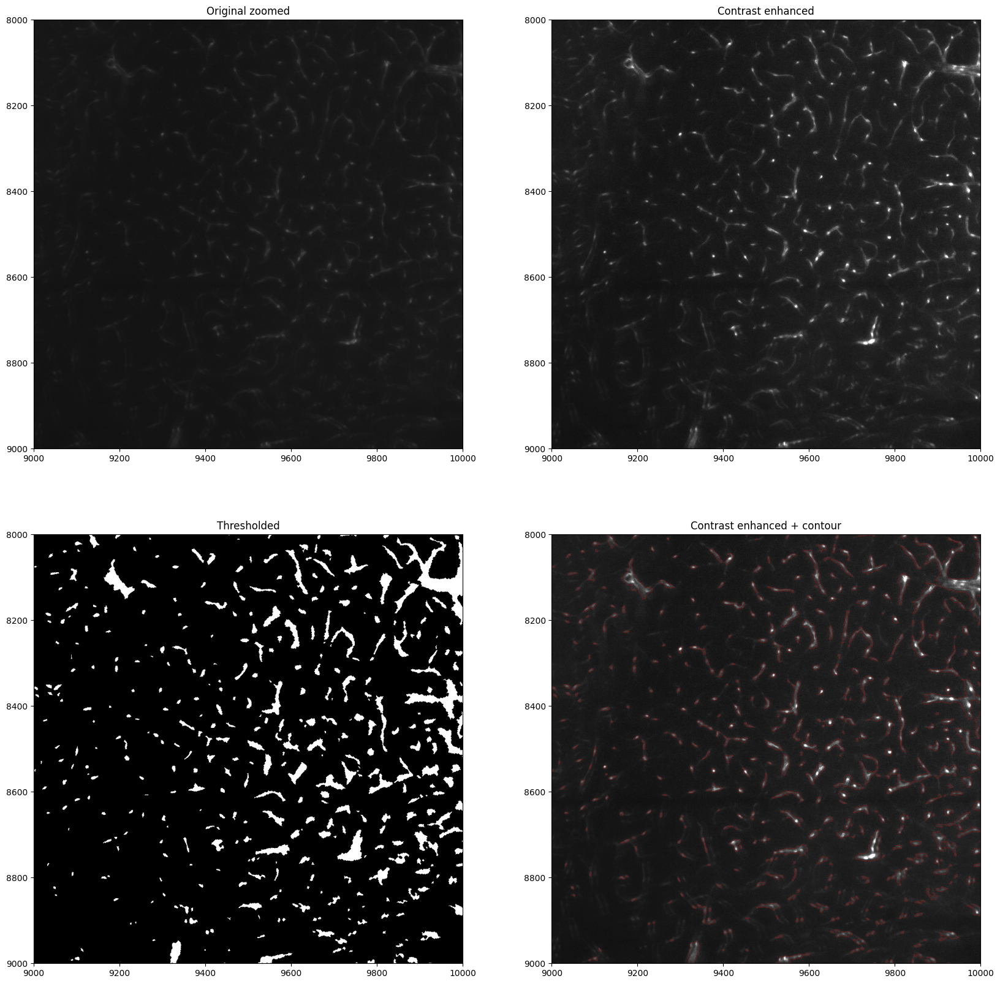

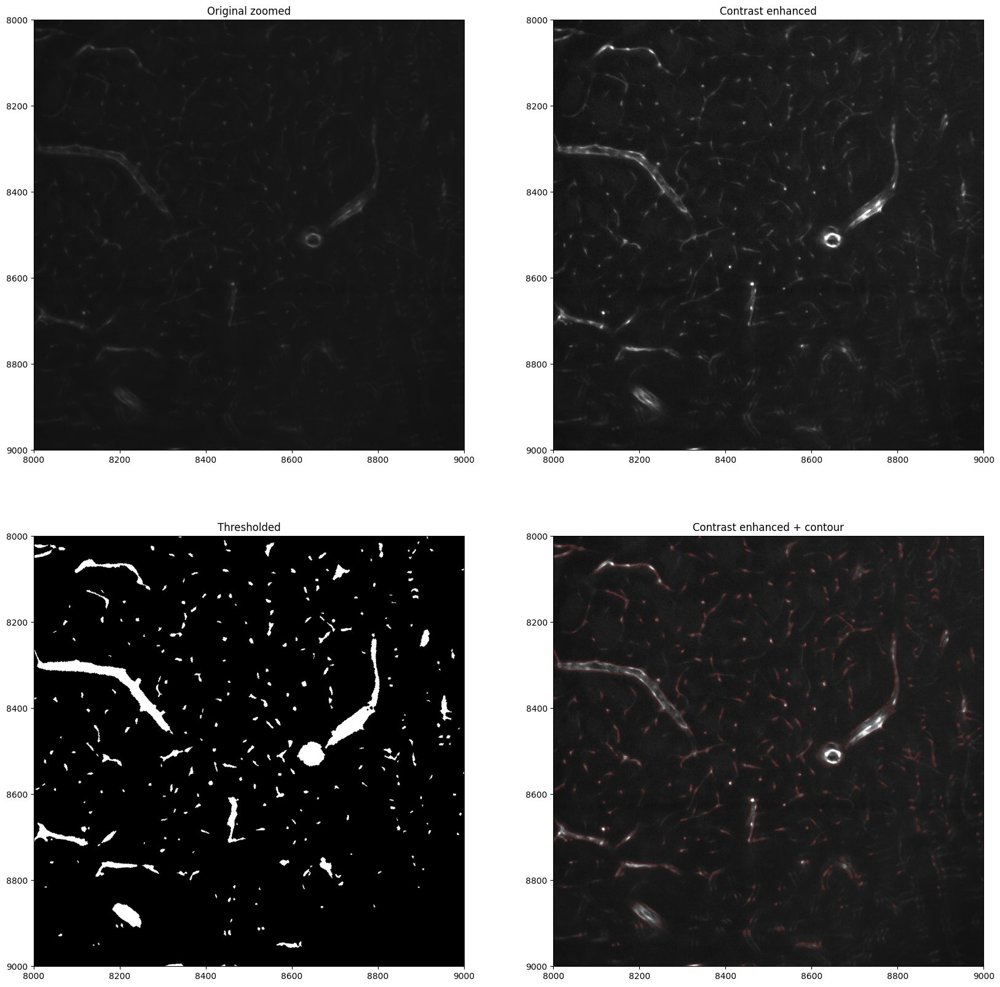

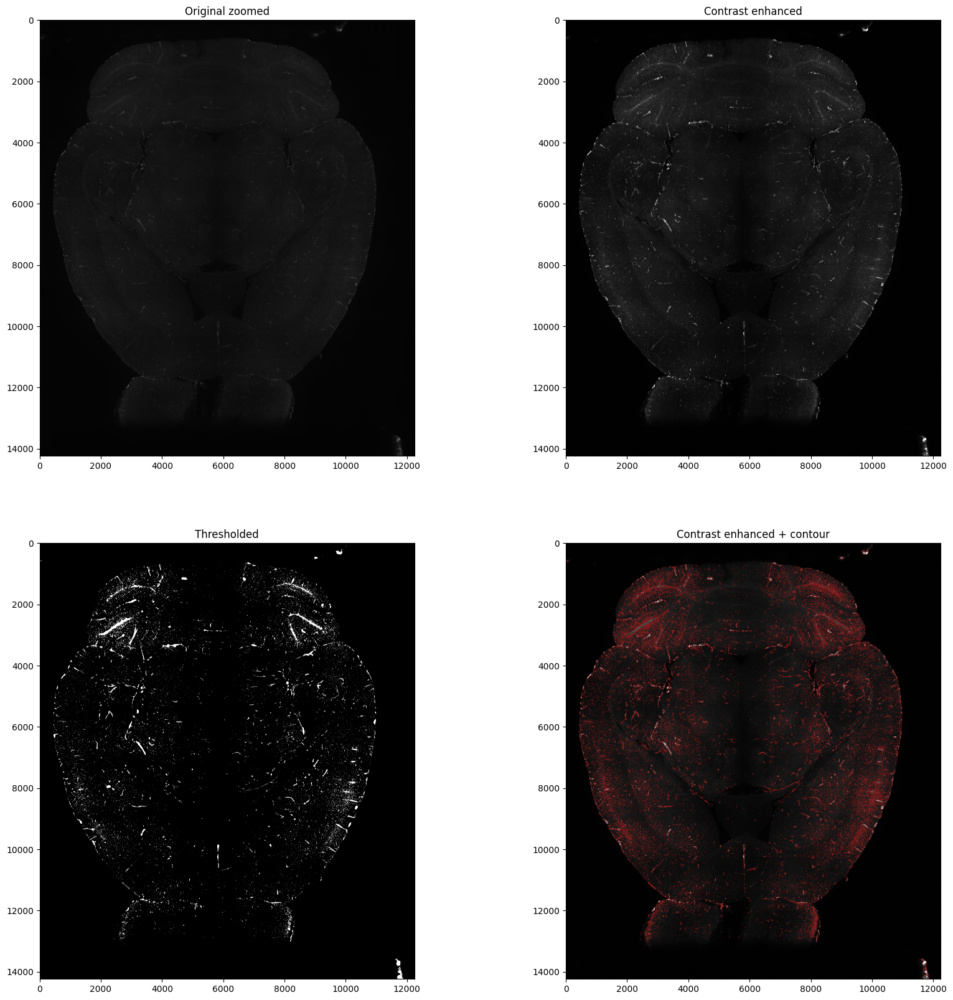

In [15]:
from skimage.morphology import remove_small_objects, binary_closing, disk
from scipy.ndimage import binary_fill_holes


min_size = 10  # Minimum size of objects to keep
thresh = 45  # 35
xlim = [9000, 10000]  # 8000, 9000 or 9000, 10000
ylim = [8000, 9000]  # 8000, 9000

image_enhanced = gamma_correction(curr_img, gamma=gamma)

contrast_image1 = auto_contrast(image_enhanced, alpha=contrast_alpha)

thresh_contrast = contrast_image1.copy()
#thresh_contrast = thresh_contrast[8000:9000, 8000:9000]
thresh_contrast[thresh_contrast < thresh] = 0
thresh_contrast[thresh_contrast != 0] = 1
thresh_contrast = thresh_contrast.astype(bool)

thresh_contrast = remove_small_objects(thresh_contrast, min_size=min_size)

# Fill holes
thresh_contrast = binary_fill_holes(thresh_contrast)

selem = disk(2)  # Structuring element for closing
thresh_contrast = binary_closing(thresh_contrast, selem)

show_4(curr_img, contrast_image1, thresh_contrast, xlim=xlim, ylim=ylim)

show_4(curr_img, contrast_image1, thresh_contrast, xlim=ylim, ylim=ylim)

show_4(curr_img, contrast_image1, thresh_contrast, xlim=None, ylim=None)

#save_figure(image_ch0, "1303_original.png")
#save_figure(curr_img, "1303_original.png")
#save_figure(contrast_image, "1303_contours.png", contours=thresh_contrast)

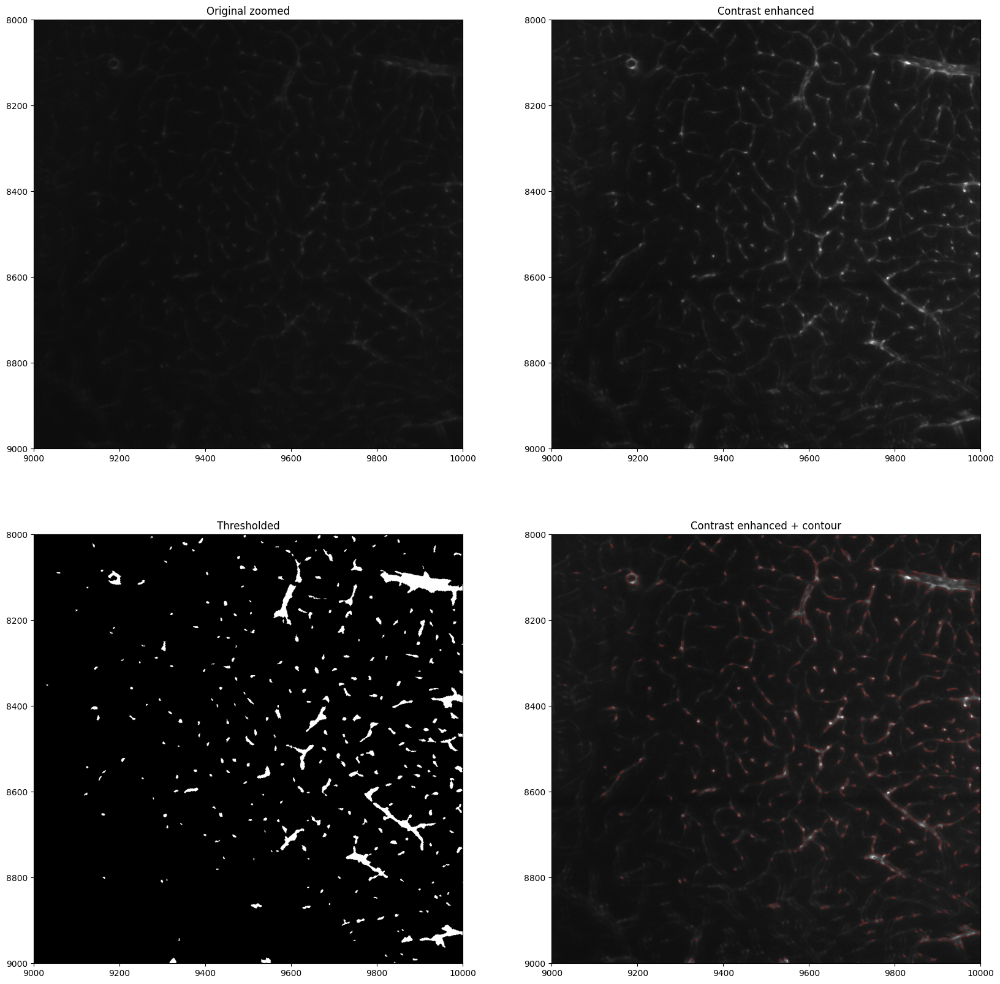

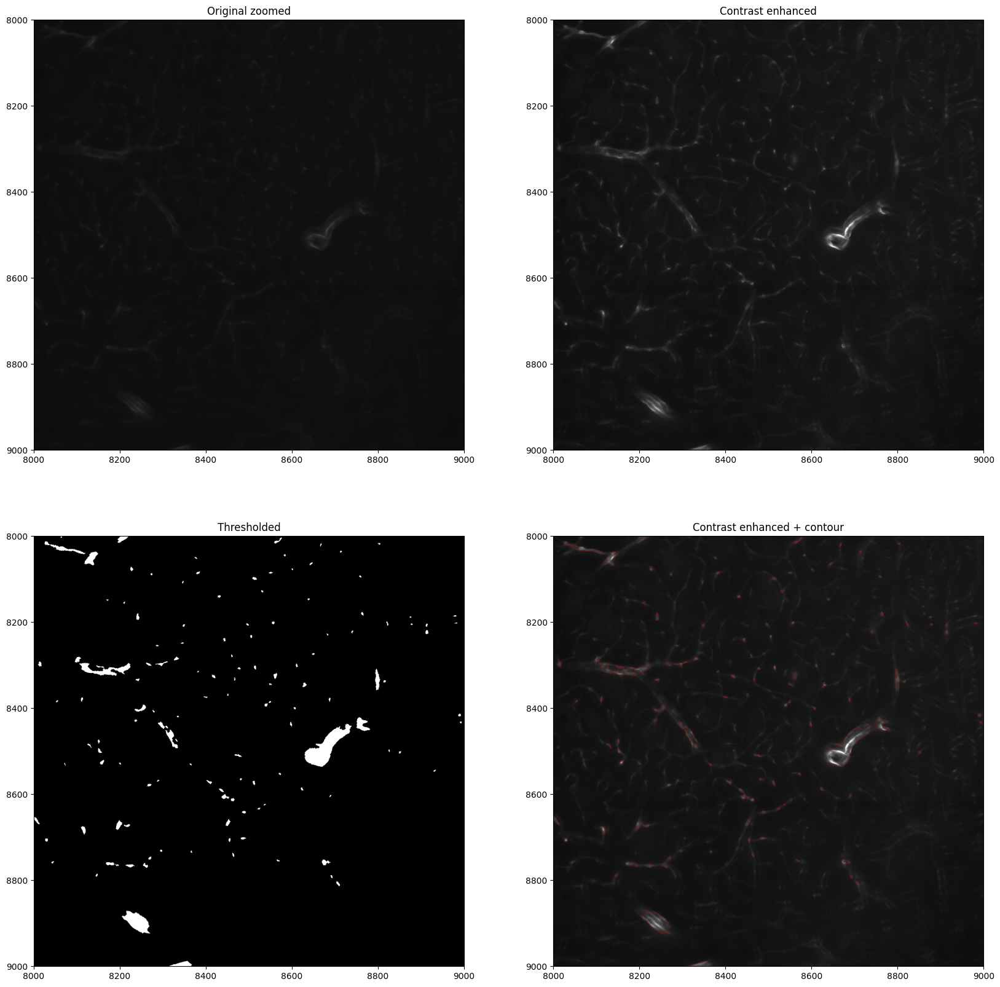

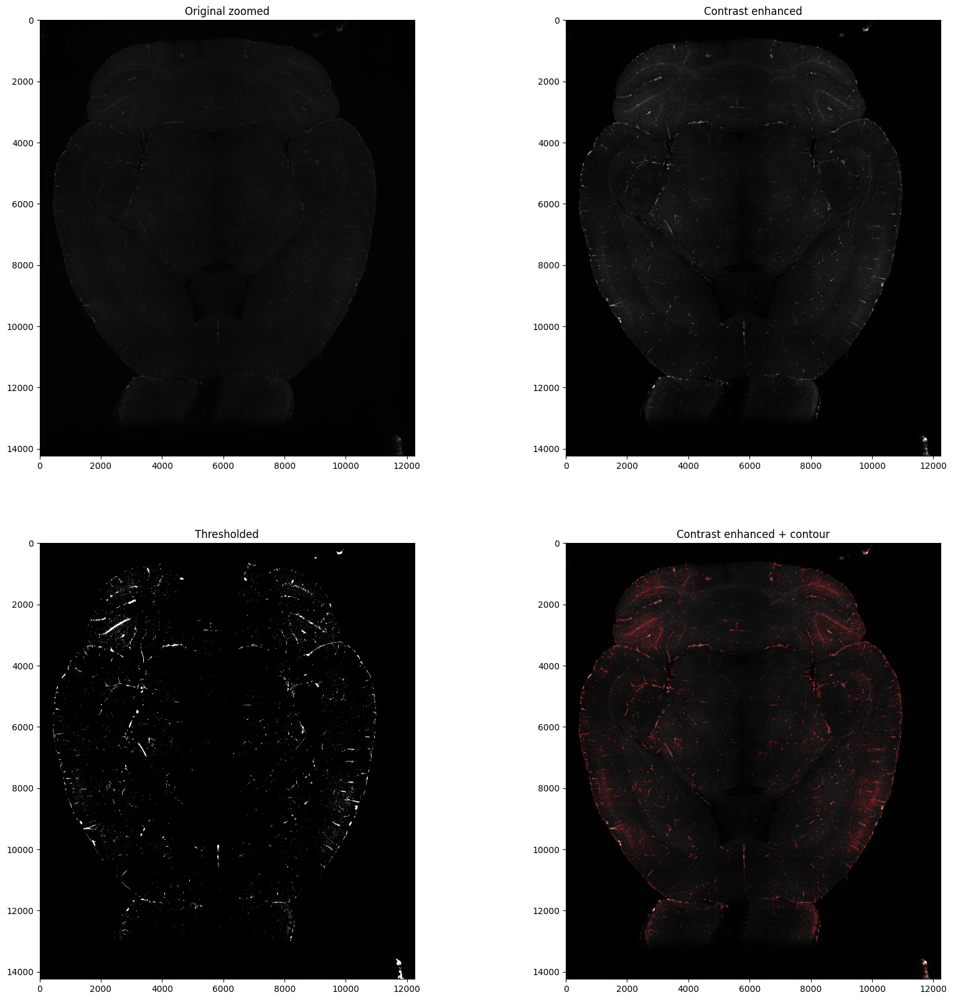

In [16]:
curr_average = compute_average_image(images)

min_size = 10  # Minimum size of objects to keep
thresh = 45  # 35
xlim = [9000, 10000]  # 8000, 9000 or 9000, 10000
ylim = [8000, 9000]  # 8000, 9000

image_enhanced = gamma_correction(curr_average, gamma=gamma)

contrast_image2 = auto_contrast(image_enhanced, alpha=contrast_alpha)

thresh_contrast = contrast_image2.copy()
#thresh_contrast = thresh_contrast[8000:9000, 8000:9000]
thresh_contrast[thresh_contrast < thresh] = 0
thresh_contrast[thresh_contrast != 0] = 1
thresh_contrast = thresh_contrast.astype(bool)

thresh_contrast = remove_small_objects(thresh_contrast, min_size=min_size)

# Fill holes
thresh_contrast = binary_fill_holes(thresh_contrast)

selem = disk(2)  # Structuring element for closing
thresh_contrast = binary_closing(thresh_contrast, selem)

show_4(curr_average, contrast_image2, thresh_contrast, xlim=xlim, ylim=ylim)

show_4(curr_average, contrast_image2, thresh_contrast, xlim=ylim, ylim=ylim)

show_4(curr_average, contrast_image2, thresh_contrast, xlim=None, ylim=None)

#save_figure(image_ch0, "1303_original.png")
#save_figure(curr_img, "1303_original.png")
#save_figure(contrast_image, "1303_contours.png", contours=thresh_contrast)

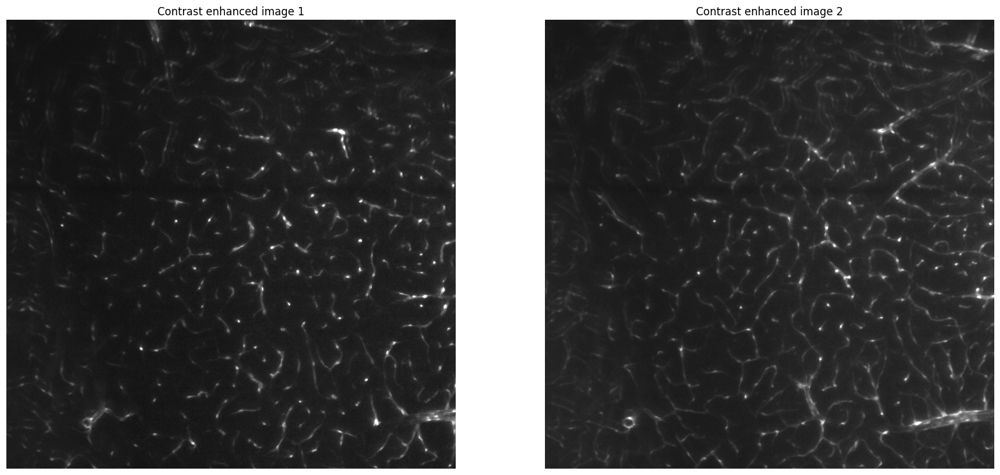

In [9]:
plt.figure(figsize=(20, 20))
plt.subplot(1, 2, 1)
plt.imshow(contrast_image1, cmap='gray')
plt.title("Contrast enhanced image 1")
plt.axis('off')
plt.xlim(xlim)
plt.ylim(ylim)
plt.subplot(1, 2, 2)
plt.imshow(contrast_image2, cmap='gray')
plt.title("Contrast enhanced image 2")
plt.axis('off')
plt.xlim(xlim)
plt.ylim(ylim)
plt.show()

## Hessian Filter
https://examples.itk.org/src/nonunit/review/segmentbloodvesselswithmultiscalehessianbasedmeasure/documentation

In [10]:
import itk
import numpy as np


def detect_vessels(input_image: np.ndarray, min_sigma: float=1.0, max_sigma: float=10.0, num_steps: int=10):
    # Run ITK
    input_image = itk.image_from_array(input_image)
    #input_image = itk.imread(input_image, itk.F)

    ImageType = type(input_image)
    Dimension = input_image.GetImageDimension()
    HessianPixelType = itk.SymmetricSecondRankTensor[itk.D, Dimension]
    HessianImageType = itk.Image[HessianPixelType, Dimension]

    objectness_filter = itk.HessianToObjectnessMeasureImageFilter[
        HessianImageType, ImageType
    ].New()
    objectness_filter.SetBrightObject(False)  # Set to True if the structures are bright on a dark background
    objectness_filter.SetScaleObjectnessMeasure(False)  # Set to True to scale the objectness measure by the scale
    objectness_filter.SetAlpha(0.5)  # Sensitivity to blob-like structures
    objectness_filter.SetBeta(1.0)   # Sensitivity to plate-like structures
    objectness_filter.SetGamma(5.0)  # Sensitivity to noise

    multi_scale_filter = itk.MultiScaleHessianBasedMeasureImageFilter[
        ImageType, HessianImageType, ImageType
    ].New()
    multi_scale_filter.SetInput(input_image)
    multi_scale_filter.SetHessianToMeasureFilter(objectness_filter)
    multi_scale_filter.SetSigmaStepMethodToLogarithmic()
    multi_scale_filter.SetSigmaMinimum(min_sigma)
    multi_scale_filter.SetSigmaMaximum(max_sigma)
    multi_scale_filter.SetNumberOfSigmaSteps(num_steps)

    OutputPixelType = itk.UC
    OutputImageType = itk.Image[OutputPixelType, Dimension]

    rescale_filter = itk.RescaleIntensityImageFilter[ImageType, OutputImageType].New()
    rescale_filter.SetInput(multi_scale_filter)
    rescale_filter.Update()

    # Get numpy array
    segmented_vessels = rescale_filter.GetOutput()
    segmented_vessels_array = itk.array_view_from_image(segmented_vessels)
    segmented_vessels_array = np.asarray(segmented_vessels_array, dtype=np.float32)
    return segmented_vessels_array


def process_vessels(vessel_image: np.ndarray, thresh: int, min_size: int=10, smoothing: int=3):
    # Process the thresholded vessels
    thresholded_vessels = vessel_image > thresh
    thresholded_vessels = np.invert(thresholded_vessels)

    # Get rid of small objects
    thresholded_vessels = remove_small_objects(thresholded_vessels, min_size=min_size)

    # Smoothen edges
    thresholded_vessels = binary_closing(thresholded_vessels, footprint=disk(smoothing))
    
    return thresholded_vessels


Shape: (701, 694)
Min: 0.0
Max: 255.0
Mean: 225.22534
Median: 254.0
Std: 73.653725


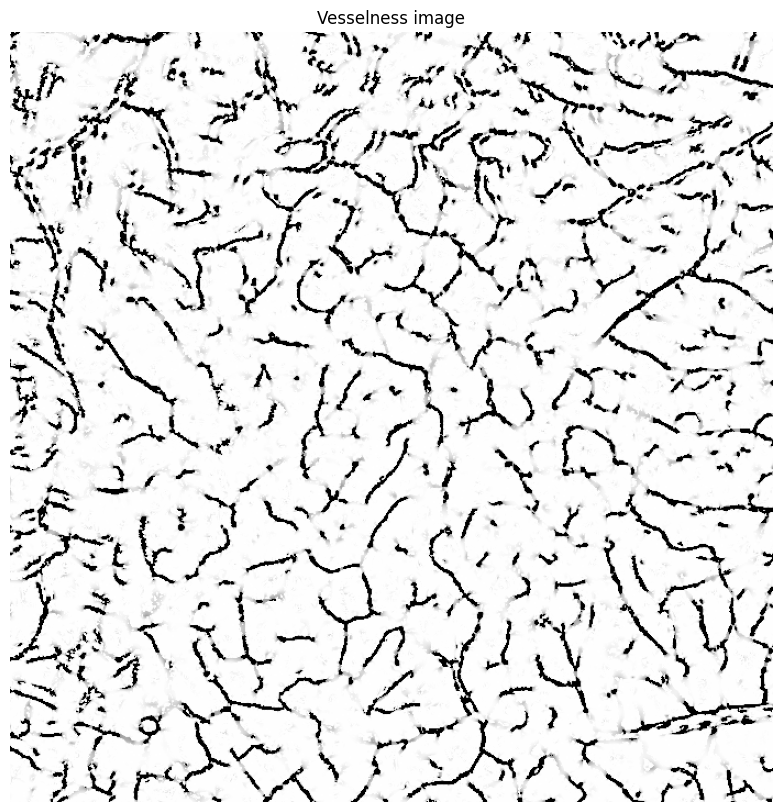

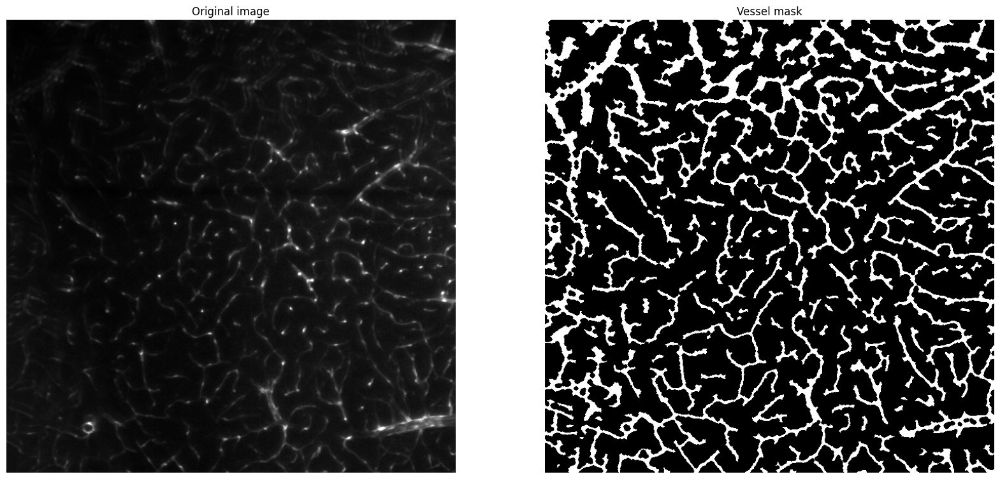

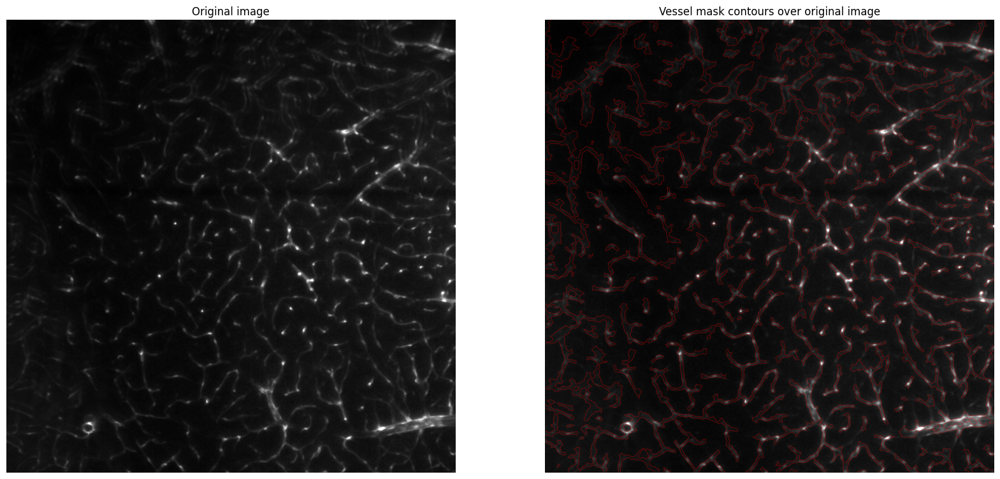

In [11]:
# Parameters
input_image = "slice.png"
output_image = "itk_output.png"

# Parameters for vessel detection
sigma_minimum = 1.0  # Range of scales in which MultiScaleHessianBasedMeasureImageFilter will search for vessels
sigma_maximum = 10.0
number_of_sigma_steps = 10  # Number of scales to search for vessels

# Parameters for post-processing
thresh = 230  # Threshold for binarization
min_size = 10  # Minimum size of objects to keep
smoothing = 3  # Smoothing factor for closing


# Load the image
input_image = itk.imread(input_image, itk.F)
input_image = itk.array_from_image(input_image)

# Run the vessel detection
segmented_vessels_array = detect_vessels(input_image, sigma_minimum, sigma_maximum, number_of_sigma_steps)

# Print statistics
print("Shape:", segmented_vessels_array.shape)
print("Min:", segmented_vessels_array.min())
print("Max:", segmented_vessels_array.max())
print("Mean:", segmented_vessels_array.mean())
print("Median:",np.median(segmented_vessels_array))
print("Std:", segmented_vessels_array.std())

# Plot the raw vesselness image
plt.figure(figsize=(10, 10))
plt.imshow(segmented_vessels_array, cmap='gray')
plt.axis('off')
plt.title("Vesselness image")
plt.show()

# Process the thresholded vessels
thresholded_vessels = process_vessels(segmented_vessels_array, thresh=thresh, min_size=min_size, smoothing=smoothing)

# Show the results
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(input_image, cmap='gray')
plt.axis('off')
plt.title("Original image")
plt.subplot(1, 2, 2)
plt.imshow(thresholded_vessels, cmap='gray')
plt.axis('off')
plt.title("Vessel mask")
plt.show()

plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(input_image, cmap='gray')
plt.axis('off')
plt.title("Original image")
plt.subplot(1, 2, 2)
plt.imshow(input_image, cmap='gray')
plt.contour(thresholded_vessels, colors='red', linewidths=0.5, alpha=0.45)
plt.axis('off')
plt.title("Vessel mask contours over original image")
plt.show()

#itk.imwrite(rescale_filter.GetOutput(), output_image)
